# Exploring measures based on k-mers words frequencies 

### **Introduction**
This notebook is part of the collection of biological sequence analyses based on alignment-free distances methods primarily using the Alfpy package. In this specific notebook, measures based on k-mers words frequencies (Euclidean distance, Google distance, W-metric) are explored with visualizations using UMAP.


*(Introduction below is adapted from Vinga et al. 2003)*

To calculate distances, we first need to calculate counts of words in sequences, which is performed by first identifying L-tuples (L <= sequence length n). We can get a set W<sub>L</sub> consisting all possible L-tuples that has K elements. 

The count ($c_{L,i}^X$ and $c_{L,i}^Y$) is then calculated by taking a sliding window L-wide through the sequence from position 1 to n-L+1, which again gives K elements.

Finally, word frequencies f<sup>X</sup><sub>L</sub> is used to approximate the probability of finding a specific word by finding relative abundance of each word out of the total counts, which will form a set of numeric vectors.





#### **Euclidean distance**

For each word-length L, the squared Euclidean distance between sequences X and Y is determined by the sum of (count X - count Y)<sup>2</sup> in each L from 1st to Kth L. Euclidean distance is then attained by taking square-root of the result.

$
\text{{Euclidean Distance}} = \sqrt{{\sum_{i=1}^{K} (c_{L,i}^X - c_{L,i}^Y)^2}}
$

According to the Alfpy word_distance.py documentation, the square-rooted Euclidean distance is denoted as **euclid_norm**. Thus, the notebook utilizes the codes below to calculate and derive the Euclidean distance matrix:
> dist = word_distance.Distance(counts, 'euclid_norm')\
> euc_matrix = distmatrix.create(seq_records.id_list, dist)

The Square Euclidean Distance in Alfpy is **euclid_squared**, which can be used for large datasets of sequences to be more computationally efficient.
> dist = word_distance.Distance(counts, 'euclid_squared')\
> euc_matrix = distmatrix.create(seq_records.id_list, dist)


#### **Normalized Google distance (NGD)**
(*Adapted from Choi and Rashid 2008*)

Normalized Google Distance is a way of finding semantic similarity in web pages, which is derived from the number of hits from Google for a given set of keywords.

$
\text{{NGD}}(w_1, w_2) = \frac{{\max\{\text{{log}}(n_1), \text{{log}}(n_2))\} - \text{{log}}(n_{12})}}{{\text{{log}}(M)- \min\{\text{{log}}(n_1), \text{{log}}(n_2)\}}}
$

In the formula, M is the total number of web pages ever searched by Google. n1 and n2 are number of hits for terms w1 and w2, respectively; and n12 is the number of web pages with both w1 and w2.

In Alfpy word_distance.py, NGD can be calculated using 

>gg_dist = word_distance.Distance(counts, 'google')\
>gg_matrix = distmatrix.create(seq_records.id_list, gg_dist)

#### **Bray-Curtis distance**
*(Adapted from Ricotta & Podani 2017)*

As previous literature suggested, Euclidean distance may not always be the best method when the data contain zeros. Bray-Curtis distance provides another possible solution. As often used in ecology, Bray-Curtis distance can measure the relativization of species-wise differences by reflecting the proportion of the total species abundances in which the two plots differ.

$
\text{{BC}}(UV) = \frac{\sum_{i=1}^{S}|X_Uj - X_Vj|}{\sum_{i=1}^{S}(X_Uj + X_Vj)}
$

The three distances above are tested because they are not only representative distance method, but also outperformed other distances in the benchmark of alfpy.


#### Work-cited
Vinga, Susana, and Jonas Almeida. “Alignment-free sequence comparison-a review.” Bioinformatics (Oxford, England) vol. 19,4 (2003): 513-23. doi:10.1093/bioinformatics/btg005

Lee Jun Choi and N. A. Rashid, "Adapting normalized google similarity in protein sequence comparison," 2008 International Symposium on Information Technology, Kuala Lumpur, Malaysia, 2008, pp. 1-5. doi: 10.1109/ITSIM.2008.4631601

Ricotta, C., & Podani, J. (2017). "On some properties of the Bray-Curtis dissimilarity and their ecological meaning," Ecological Complexity, 31, 201–205. doi:10.1016/j.ecocom.2017.07.003 


***
# Quick Access to

#### [Euclidean Distance Method](#Euclidean-Distance-Method)
>[Calculate Euclidean Distance](#calculate-euclidean-distance)\
>[Multidimensional Scaling and Dataframe Transformation](#multidimensional-scaling-and-dataframe-transformation)\
>[UMAP using Euclidean Distance](#plot-euclidean-distance-umap)

#### [Squared Euclidean Distance Method](#squared-euclidean-distance-method)

#### [Google Distance Method](#Google-Distance-Method)
>[Calculate Google Distance](#calculate-google-distance)\
>[Multidimensional Scaling and Dataframe Transformation](#multidimensional-scaling-&-dataframe-transformation)\
>[UMAP using Google Distance](#Umap-using-Google-Distance)

#### [Bray-Curtis Distance Method](#Bray_Curtis-Distance-Method)
>[Calculate Bray-Curtis Distance](#calculate-bray-curtis-distance)\
>[Multidimensional Scaling and Dataframe Transformation](#transform)\
>[UMAP using Google Distance](#umap)
***

# Import packages

In [101]:
import pandas as pd
import umap
import umap.plot
import plotly.express as px

from alfpy.utils import seqrecords
from alfpy.utils import distmatrix
from alfpy import ncd
from sklearn.manifold import MDS


from alfpy import word_pattern
from alfpy import word_vector
from alfpy import word_distance

from alfpy.utils import distmatrix

# Import files to analyze

In [81]:
file = open('bacteria-score3-length4.fasta')
seq_records = seqrecords.read_fasta(file)
file.close()

data = pd.read_csv("bacteria-score3-length4.tsv", sep="\t" )

In [82]:
# Check unique types of EC numbers
unique_EC = pd.DataFrame(pd.unique(data["EC number"]))

In [83]:
# Re-sort EC numbers so that all go to only one category
import re
import numpy as np
from copy import deepcopy

pattern1 = "(6\.1\.1\.\d);\s+"
pattern2 = "[^\w\s]+;"
pattern3 = ";\s+(6\.1\.1\.\w)"

copy_row = []



for i, row in data.iterrows():
        # For those with separate functions, disregard the EC that does not start with 6.1.1
    result1 = re.findall(pattern1, row["EC number"])
    result2 = re.findall(pattern2, row["EC number"])
    result3 = re.findall(pattern3, row["EC number"])
    #if result2:
        # change the original EC number to only the ligase one

    if result3:
        data.at[i, "EC number"] = result3[0]

"""   if result1:
        new_row = row.copy()
        new_row["EC number"] = result1[0]
        data.at[i, "EC number"] = result3[0]
"""

pd.DataFrame(pd.unique(data["EC number"]))





,0
0,6.1.1.20
1,6.1.1.2
2,6.1.1.1
3,6.1.1.4
4,6.1.1.14


In [84]:
# Create a dictionary corresponding EC number and their types of aa ligases

ec_typeligases = {
    "6.1.1.1" : "Tyrosine",
    "6.1.1.2" : "Tryptophan",
    "6.1.1.3" : "Threonine",
    "6.1.1.4" : "Leucine",
    "6.1.1.5" : "Isoleucine",
    "6.1.1.6" : "Lysine",
    "6.1.1.7" : "Alanine",
    "6.1.1.9" : "Valine",
    "6.1.1.10" : "Methionine",
    "6.1.1.11" : "Serine",
    "6.1.1.12" : "Aspartate",
    "6.1.1.13" : "D-alanine",
    "6.1.1.14" : "Glycine",
    "6.1.1.15" : "Proline",
    "6.1.1.16" : "Cysteine",
    "6.1.1.17" : "Glutamate",
    "6.1.1.18" : "Glutamine",
    "6.1.1.19" : "Arginine",
    "6.1.1.20" : "Phenylalanine",
    "6.1.1.21" : "Histidine",
    "6.1.1.22" : "Asparagine",
    "6.1.1.23" : "Aspartate-Asn",
    "6.1.1.24" : "Glutamate-Gln",
    "6.1.1.26" : "Pyrrolysine-Pyl",
    "6.1.1.27" : "O-phospho-L-serine",
    "6.1.1.28" : "Proline/cysteine",

    "6.1.1.-": "All_aa"
    
}

ec_classligase = {
    "6.1.1.1" : "I",
    "6.1.1.2" : "I",
    "6.1.1.3" : "IIA",
    "6.1.1.4" : "I",
    "6.1.1.5" : "I",
    "6.1.1.6" : "IIB",
    "6.1.1.7" : "IIC",
    "6.1.1.9" : "I",
    "6.1.1.10" : "I",
    "6.1.1.11" : "IIA",
    "6.1.1.12" : "IIB",
    "6.1.1.13" : "IIC",
    "6.1.1.14" : "IIA",
    "6.1.1.15" : "IIA",
    "6.1.1.16" : "I",
    "6.1.1.17" : "I",
    "6.1.1.18" : "I",
    "6.1.1.19" : "I",
    "6.1.1.20" : "IIC",
    "6.1.1.21" : "II",
    "6.1.1.22" : "IIB",
    "6.1.1.23" : "II",
    "6.1.1.24" : "I", # Not sure if this and below are correct ***
    "6.1.1.26" : "II",
    "6.1.1.27" : "II",
    "6.1.1.28" : "I",

    "6.1.1.-": "XX" # Name the special case

}


In [85]:
# Add the two dictionaries to the dataframe
data["AAs"] = data["EC number"].map(ec_typeligases)
data["Class"] = data["EC number"].map(ec_classligase)

# Check
data.head()
data["AAs"].describe()

count               741
unique                5
top       Phenylalanine
freq                598
Name: AAs, dtype: object

In [86]:
data["Class"].describe()

count     741
unique      3
top       IIC
freq      598
Name: Class, dtype: object

In [87]:
# Add kingdom/taxonomy to the dataframe

# Use regular expression to sort out proteins of different types 

entries = []
types = []
pattern = "(\w+)\s+\(superkingdom\)"

for i, row in data.iterrows():
    result = re.findall(pattern, row["Taxonomic lineage"])
    if result:
        for entry in row["Entry"].split():
            entries.append(entry)
            types.append(result[0])

taxonomies = {}
taxonomies["Entry"] = entries
taxonomies["taxonomy"] = types

taxonomy = pd.DataFrame(taxonomies)

taxonomy

,Entry,taxonomy
0,A0AHW2,Bacteria
1,A0KKP5,Bacteria
2,A0L4K0,Bacteria
3,A0LFC6,Bacteria
4,A0M6W9,Bacteria
...,...,...
736,Q9Z7A4,Bacteria
737,Q9ZD76,Bacteria
738,Q9ZDB5,Bacteria
739,Q9ZJX4,Bacteria


In [88]:
merged_data = pd.merge(data, taxonomy, on="Entry")

merged_data.head()

,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,EC number,Taxonomic lineage,Taxonomic lineage (Ids),Sequence,AAs,Class,taxonomy
0,A0AHW2,reviewed,SYFA_LISW6,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS lwe1176,Listeria welshimeri serovar 6b (strain ATCC 35...,350,6.1.1.20,"Listeria welshimeri (species), Listeria (genus...","1643 (species), 1637 (genus), 186820 (family),...",MLEQLQTLKSEAETQIKEASDLKTLNDLRVKYLGKKGPMTEIMKQM...,Phenylalanine,IIC,Bacteria
1,A0KKP5,reviewed,SYFA_AERHH,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS AHA_2323,Aeromonas hydrophila subsp. hydrophila (strain...,327,6.1.1.20,Aeromonas hydrophila subsp. hydrophila (subspe...,"196023 (subspecies), 644 (species), 642 (genus...",MQQLEEVVGQARAEIEGVSDIAALDEIRVKYLGKKGFFTEQMKGLG...,Phenylalanine,IIC,Bacteria
2,A0L4K0,reviewed,SYFA_MAGMM,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS Mmc1_0367,Magnetococcus marinus (strain ATCC BAA-1437 / ...,348,6.1.1.20,"Magnetococcus marinus (species), Magnetococcus...","1124597 (species), 162171 (genus), 1191479 (fa...",MTMRNALQQLEQEAISAISSSENLKDLEDVRIRFMGKKGSITQQYG...,Phenylalanine,IIC,Bacteria
3,A0LFC6,reviewed,SYFA_SYNFM,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS Sfum_0428,Syntrophobacter fumaroxidans (strain DSM 10017...,336,6.1.1.20,"Syntrophobacter fumaroxidans (species), Syntro...","119484 (species), 29526 (genus), 213465 (famil...",MEDAVRKLLNSADHEVLALANDARAIEQLKVRFLGRKGELARLFKE...,Phenylalanine,IIC,Bacteria
4,A0M6W9,reviewed,SYFA_GRAFK,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS GFO_3424,Gramella forsetii (strain KT0803),339,6.1.1.20,"Gramella forsetii (species), Gramella (genus),...","411153 (species), 292691 (genus), 49546 (famil...",MIDKIKGHIADVESFNAKTKDEIEAFRIKYLGKKGILNDFFAEFKN...,Phenylalanine,IIC,Bacteria


In [89]:
# Create another dictionary converting AA's to numbers usable to UMAP

aa_num = {
    "Tyrosine":1,
    "Tryptophan":2,
    "Threonine":3,
    "Leucine":4,
    "Isoleucine":5,
    "Lysine":6,
    "Alanine":7,
    "Valine":9,
    "Methionine":10,
    "Serine":11,
    "Aspartate":12,
    "D-alanine":13,
    "Glycine":14,
    "Proline":15,
    "Cysteine":16,
    "Glutamate":17,
    "Glutamine":18,
    "Arginine":19,
    "Phenylalanine":20,
    "Histidine":21,
    "Asparagine":22,
    "Aspartate-Asn":23,
    "Glutamate-Gln":24,
    "Pyrrolysine-Pyl":26,
    "O-phospho-L-serine":27,
    "Proline/cysteine":28,

    "All_aa":100
    
}

In [90]:
data["transformed_aa"] = data["AAs"].map(aa_num)

data.head()



,Entry,Reviewed,Entry Name,Protein names,Gene Names,Organism,Length,EC number,Taxonomic lineage,Taxonomic lineage (Ids),Sequence,AAs,Class,transformed_aa
0,A0AHW2,reviewed,SYFA_LISW6,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS lwe1176,Listeria welshimeri serovar 6b (strain ATCC 35...,350,6.1.1.20,"Listeria welshimeri (species), Listeria (genus...","1643 (species), 1637 (genus), 186820 (family),...",MLEQLQTLKSEAETQIKEASDLKTLNDLRVKYLGKKGPMTEIMKQM...,Phenylalanine,IIC,20
1,A0KKP5,reviewed,SYFA_AERHH,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS AHA_2323,Aeromonas hydrophila subsp. hydrophila (strain...,327,6.1.1.20,Aeromonas hydrophila subsp. hydrophila (subspe...,"196023 (subspecies), 644 (species), 642 (genus...",MQQLEEVVGQARAEIEGVSDIAALDEIRVKYLGKKGFFTEQMKGLG...,Phenylalanine,IIC,20
2,A0L4K0,reviewed,SYFA_MAGMM,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS Mmc1_0367,Magnetococcus marinus (strain ATCC BAA-1437 / ...,348,6.1.1.20,"Magnetococcus marinus (species), Magnetococcus...","1124597 (species), 162171 (genus), 1191479 (fa...",MTMRNALQQLEQEAISAISSSENLKDLEDVRIRFMGKKGSITQQYG...,Phenylalanine,IIC,20
3,A0LFC6,reviewed,SYFA_SYNFM,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS Sfum_0428,Syntrophobacter fumaroxidans (strain DSM 10017...,336,6.1.1.20,"Syntrophobacter fumaroxidans (species), Syntro...","119484 (species), 29526 (genus), 213465 (famil...",MEDAVRKLLNSADHEVLALANDARAIEQLKVRFLGRKGELARLFKE...,Phenylalanine,IIC,20
4,A0M6W9,reviewed,SYFA_GRAFK,Phenylalanine--tRNA ligase alpha subunit (EC 6...,pheS GFO_3424,Gramella forsetii (strain KT0803),339,6.1.1.20,"Gramella forsetii (species), Gramella (genus),...","411153 (species), 292691 (genus), 49546 (famil...",MIDKIKGHIADVESFNAKTKDEIEAFRIKYLGKKGILNDFFAEFKN...,Phenylalanine,IIC,20


# Euclidean Distance Method

[Back to top](#Quick-Access-to)

#### Calculate Euclidean Distance

In [91]:
"""Calculate Euclidean distance bewteen word counts"""
word_pattern = word_pattern.create(seq_records.seq_list, word_size=2)
counts = word_vector.Counts(seq_records.length_list, word_pattern)
dist = word_distance.Distance(counts, 'euclid_norm')
euc_matrix = distmatrix.create(seq_records.id_list, dist)
#euc_matrix.display()


In [92]:
"""Convert the Euclidean distance matrix into usable pandas format"""

a = euc_matrix.display()

# Create memory string
import io
a = io.StringIO()

# Write phylip format of matrix output into the memory
euc_matrix.writer(a, 'phylip', 7)

# Get the written string
a.seek(0)

# Create pandas dataframe table
dist_data = pd.read_csv(a,sep="\s+",skiprows=[0],header=None,index_col=0)
dist_data.index.name = None
dist_data.columns = dist_data.index # Make the first row (column names) the same as the indeces 


   741
sp|A0AHW2| 0.0000000 22.4722051 23.5372046 23.2379001 21.1896201 21.2367606 20.8566536 30.0333148 24.6779254 22.8473193 22.6053091 27.4954542 22.8254244 22.4722051 23.7276210 28.5131549 21.1423745 20.6639783 27.7308492 24.1660919 23.1516738 25.5929678 24.2693222 23.3666429 23.4946802 25.0599282 20.8566536 25.1594913 21.9317122 24.1867732 23.1516738 23.9791576 27.3861279 21.8632111 19.7989899 20.9523268 21.6333077 23.7697286 23.1300670 22.4276615 27.5862284 21.8860686 22.1133444 23.0651252 22.9782506 21.1423745 25.2982213 20.8806130 25.2586619 22.9564806 22.2485955 22.9782506 20.4939015 21.0000000 22.7596134 24.3515913 21.2132034 21.7485632 28.5832119 22.9564806 24.6373700 23.6643191 21.4009346 24.3926218 22.4053565 23.0434372 22.6715681 21.9317122 20.6155281 22.7156334 21.4941853 21.7715411 22.2934968 20.8086520 21.2132034 24.0000000 23.1948270 22.7815715 21.2367606 20.9045450 24.4335834 21.9772610 21.0000000 20.9523268 18.0554701 23.4520788 22.0907220 22.6495033 22.7815715 20.9

In [93]:
temp = dist_data.values
temp.shape

(741, 741)

#### Multidimensional Scaling and Dataframe Transformation

In [94]:
"""Multidimensional Scaling (MDS)-- Metric and Nonmetric"""

mds = MDS(random_state = 0, dissimilarity="precomputed")
euc_transform = mds.fit_transform(temp)

/Users/yufeimeng/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


In [95]:
# Create coordinates
euc = pd.DataFrame(euc_transform, index=seq_records.id_list, columns = ["PC1", "PC2"])

euc

,PC1,PC2
sp|A0AHW2|SYFA_LISW6,10.504518,-0.816506
sp|A0KKP5|SYFA_AERHH,-2.921738,-9.440219
sp|A0L4K0|SYFA_MAGMM,3.183981,-13.020030
sp|A0LFC6|SYFA_SYNFM,-4.779773,6.098437
sp|A0M6W9|SYFA_GRAFK,6.106078,-6.790412
...,...,...
sp|Q9Z7A4|SYW_CHLPN,11.946792,18.401912
sp|Q9ZD76|SYW_RICPR,19.584331,11.953376
sp|Q9ZDB5|SYFA_RICPR,11.393031,-20.134401
sp|Q9ZJX4|SYW_HELPJ,12.663631,18.392159


In [96]:
entry = []
for i in seq_records.id_list:
    result = re.findall("\w+\|(\w+)",i)
    entry.append(result[0])

# Add the entry column 
euc["Entry"] = entry

euc

,PC1,PC2,Entry
sp|A0AHW2|SYFA_LISW6,10.504518,-0.816506,A0AHW2
sp|A0KKP5|SYFA_AERHH,-2.921738,-9.440219,A0KKP5
sp|A0L4K0|SYFA_MAGMM,3.183981,-13.020030,A0L4K0
sp|A0LFC6|SYFA_SYNFM,-4.779773,6.098437,A0LFC6
sp|A0M6W9|SYFA_GRAFK,6.106078,-6.790412,A0M6W9
...,...,...,...
sp|Q9Z7A4|SYW_CHLPN,11.946792,18.401912,Q9Z7A4
sp|Q9ZD76|SYW_RICPR,19.584331,11.953376,Q9ZD76
sp|Q9ZDB5|SYFA_RICPR,11.393031,-20.134401,Q9ZDB5
sp|Q9ZJX4|SYW_HELPJ,12.663631,18.392159,Q9ZJX4


In [97]:

# Create subset with transformed_aa and entry from data
subset = data[["Entry", "AAs","transformed_aa"]]

merged_euc = pd.merge(euc, subset)

merged_euc


,PC1,PC2,Entry,AAs,transformed_aa
0,10.504518,-0.816506,A0AHW2,Phenylalanine,20
1,-2.921738,-9.440219,A0KKP5,Phenylalanine,20
2,3.183981,-13.020030,A0L4K0,Phenylalanine,20
3,-4.779773,6.098437,A0LFC6,Phenylalanine,20
4,6.106078,-6.790412,A0M6W9,Phenylalanine,20
...,...,...,...,...,...
736,11.946792,18.401912,Q9Z7A4,Tryptophan,2
737,19.584331,11.953376,Q9ZD76,Tryptophan,2
738,11.393031,-20.134401,Q9ZDB5,Phenylalanine,20
739,12.663631,18.392159,Q9ZJX4,Tryptophan,2


#### Plot Euclidean Distance UMAP

In [98]:
aa_data = merged_euc[
    [
    "PC1",
    "PC2"
    ]
].values

mapper_euc = umap.UMAP().fit(aa_data)

<Axes: >

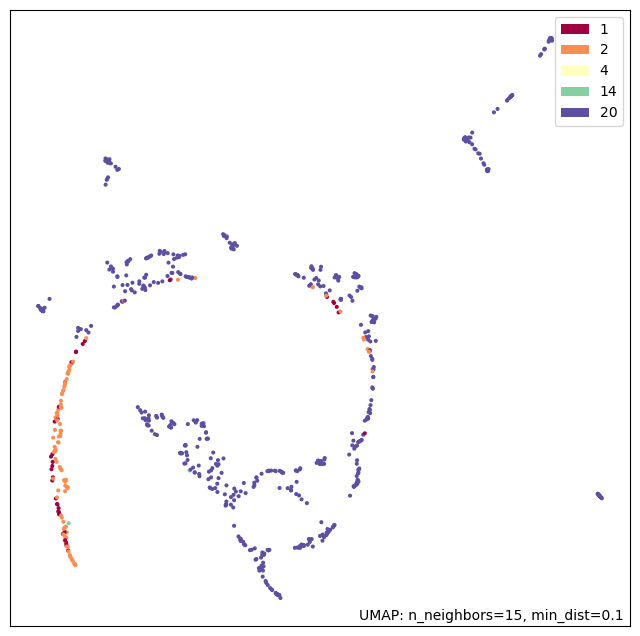

In [99]:
umap.plot.points(mapper_euc,labels=merged_euc.transformed_aa)

***
# Squared Euclidean Distance Method

[Back to top](#Quick-Access-to)

#### Calculate Squared Euclidean Distance

In [102]:
"""Calculate Euclidean distance bewteen word counts"""
word_pattern = word_pattern.create(seq_records.seq_list, word_size=2)
counts = word_vector.Counts(seq_records.length_list, word_pattern)
dist_sq = word_distance.Distance(counts, 'euclid_squared')
sq_euc_matrix = distmatrix.create(seq_records.id_list, dist_sq)

In [103]:
"""Convert the Euclidean distance matrix into usable pandas format"""

b = sq_euc_matrix.display()

# Create memory string
import io
b = io.StringIO()

# Write phylip format of matrix output into the memory
sq_euc_matrix.writer(b, 'phylip', 7)

# Get the written string
b.seek(0)

# Create pandas dataframe table
sq_dist_data = pd.read_csv(b,sep="\s+",skiprows=[0],header=None,index_col=0)
sq_dist_data.index.name = None
sq_dist_data.columns = sq_dist_data.index # Make the first row (column names) the same as the indeces 


   741
sp|A0AHW2| 0.0000000 505.0000000 554.0000000 540.0000000 449.0000000 451.0000000 435.0000000 902.0000000 609.0000000 522.0000000 511.0000000 756.0000000 521.0000000 505.0000000 563.0000000 813.0000000 447.0000000 427.0000000 769.0000000 584.0000000 536.0000000 655.0000000 589.0000000 546.0000000 552.0000000 628.0000000 435.0000000 633.0000000 481.0000000 585.0000000 536.0000000 575.0000000 750.0000000 478.0000000 392.0000000 439.0000000 468.0000000 565.0000000 535.0000000 503.0000000 761.0000000 479.0000000 489.0000000 532.0000000 528.0000000 447.0000000 640.0000000 436.0000000 638.0000000 527.0000000 495.0000000 528.0000000 420.0000000 441.0000000 518.0000000 593.0000000 450.0000000 473.0000000 817.0000000 527.0000000 607.0000000 560.0000000 458.0000000 595.0000000 502.0000000 531.0000000 514.0000000 481.0000000 425.0000000 516.0000000 462.0000000 474.0000000 497.0000000 433.0000000 450.0000000 576.0000000 538.0000000 519.0000000 451.0000000 437.0000000 597.0000000 483.0000000 

In [104]:
sq_temp = sq_dist_data.values
sq_temp.shape

(741, 741)

#### Multidimensional Scaling and Dataframe Transformation

In [105]:
mds = MDS(random_state = 0, dissimilarity="precomputed")
sq_euc_transform = mds.fit_transform(sq_temp)

/Users/yufeimeng/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


In [107]:
# Create coordinates
sq_euc = pd.DataFrame(sq_euc_transform, index=seq_records.id_list, columns = ["PC1", "PC2"])

sq_euc

,PC1,PC2
sp|A0AHW2|SYFA_LISW6,-404.824627,-71.080522
sp|A0KKP5|SYFA_AERHH,-144.269874,110.373183
sp|A0L4K0|SYFA_MAGMM,-363.971171,102.823828
sp|A0LFC6|SYFA_SYNFM,-308.702258,212.262870
sp|A0M6W9|SYFA_GRAFK,-7.107963,-175.757006
...,...,...
sp|Q9Z7A4|SYW_CHLPN,467.944349,-377.482182
sp|Q9ZD76|SYW_RICPR,317.243529,-575.952630
sp|Q9ZDB5|SYFA_RICPR,-100.895400,-597.102171
sp|Q9ZJX4|SYW_HELPJ,526.318400,-331.282935


In [108]:
entry = []
for i in seq_records.id_list:
    result = re.findall("\w+\|(\w+)",i)
    entry.append(result[0])

# Add the entry column 
sq_euc["Entry"] = entry

sq_euc

,PC1,PC2,Entry
sp|A0AHW2|SYFA_LISW6,-404.824627,-71.080522,A0AHW2
sp|A0KKP5|SYFA_AERHH,-144.269874,110.373183,A0KKP5
sp|A0L4K0|SYFA_MAGMM,-363.971171,102.823828,A0L4K0
sp|A0LFC6|SYFA_SYNFM,-308.702258,212.262870,A0LFC6
sp|A0M6W9|SYFA_GRAFK,-7.107963,-175.757006,A0M6W9
...,...,...,...
sp|Q9Z7A4|SYW_CHLPN,467.944349,-377.482182,Q9Z7A4
sp|Q9ZD76|SYW_RICPR,317.243529,-575.952630,Q9ZD76
sp|Q9ZDB5|SYFA_RICPR,-100.895400,-597.102171,Q9ZDB5
sp|Q9ZJX4|SYW_HELPJ,526.318400,-331.282935,Q9ZJX4


In [109]:
# Create subset with transformed_aa and entry from data
subset = data[["Entry", "AAs","transformed_aa"]]

merged_euc_sq = pd.merge(sq_euc, subset)

merged_euc_sq


,PC1,PC2,Entry,AAs,transformed_aa
0,-404.824627,-71.080522,A0AHW2,Phenylalanine,20
1,-144.269874,110.373183,A0KKP5,Phenylalanine,20
2,-363.971171,102.823828,A0L4K0,Phenylalanine,20
3,-308.702258,212.262870,A0LFC6,Phenylalanine,20
4,-7.107963,-175.757006,A0M6W9,Phenylalanine,20
...,...,...,...,...,...
736,467.944349,-377.482182,Q9Z7A4,Tryptophan,2
737,317.243529,-575.952630,Q9ZD76,Tryptophan,2
738,-100.895400,-597.102171,Q9ZDB5,Phenylalanine,20
739,526.318400,-331.282935,Q9ZJX4,Tryptophan,2


#### Plot Squared Euclidean Distance UMAP

In [110]:
aa_data_sq = merged_euc_sq[
    [
    "PC1",
    "PC2"
    ]
].values

mapper_euc_sq = umap.UMAP().fit(aa_data_sq)

<Axes: >

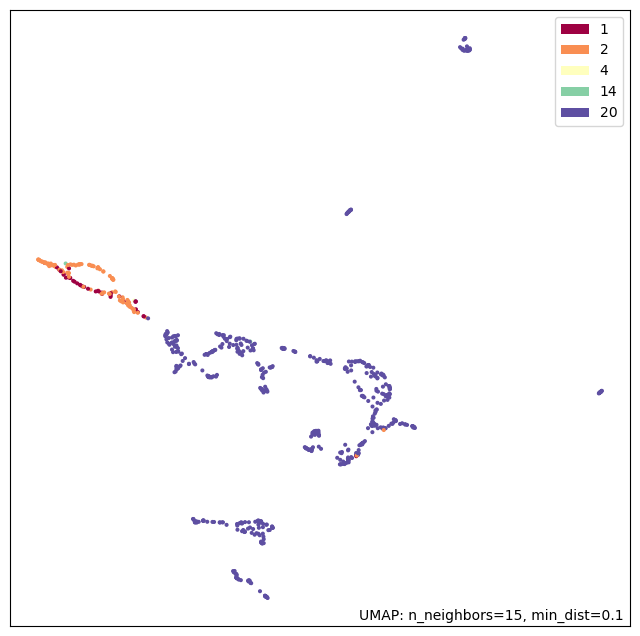

In [111]:
umap.plot.points(mapper_euc_sq,labels=merged_euc.transformed_aa)

***
# Google Distance Method
[Back to top](#Quick-Access-to)

#### Calculate Google Distance

In [48]:
# Calculate Google Distance
gg_freqs = word_vector.Freqs(seq_records.length_list, word_pattern)
gg_dist = word_distance.Distance(counts, 'google')
gg_dist.pairwise_distance(0, 1)
gg_matrix = distmatrix.create(seq_records.id_list, gg_dist)

gg_matrix.data

array([[0.        , 0.42979943, 0.43839542, ..., 0.48424069, 0.5730659 ,
        0.46704871],
       [0.42979943, 0.        , 0.40345821, ..., 0.47277937, 0.57361963,
        0.44648318],
       [0.43839542, 0.40345821, 0.        , ..., 0.46704871, 0.60230548,
        0.44380403],
       ...,
       [0.48424069, 0.47277937, 0.46704871, ..., 0.        , 0.61891117,
        0.48137536],
       [0.5730659 , 0.57361963, 0.60230548, ..., 0.61891117, 0.        ,
        0.54740061],
       [0.46704871, 0.44648318, 0.44380403, ..., 0.48137536, 0.54740061,
        0.        ]])

#### Multidimensional Scaling & Dataframe Transformation

In [49]:
# Create Umap

gg = pd.DataFrame(gg_matrix.data, index=seq_records.id_list, columns=seq_records.id_list)
gg

# Multidimensional Scaling (MDS)

mds = MDS(random_state = 0, dissimilarity="precomputed")
gg_transform = mds.fit_transform(gg)


# Create coordinates
google = pd.DataFrame(gg_transform, index=seq_records.id_list, columns = ["PC1", "PC2"])

google

/Users/yufeimeng/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


,PC1,PC2
sp|A0AHW2|SYFA_LISW6,-0.096210,0.150628
sp|A0KKP5|SYFA_AERHH,0.159201,0.167252
sp|A0L4K0|SYFA_MAGMM,0.045098,0.116460
sp|A0LFC6|SYFA_SYNFM,0.129598,-0.052914
sp|A0M6W9|SYFA_GRAFK,-0.082610,0.228523
...,...,...
sp|Q9Z7A4|SYW_CHLPN,-0.400500,-0.060399
sp|Q9ZD76|SYW_RICPR,-0.474525,-0.028672
sp|Q9ZDB5|SYFA_RICPR,0.007685,0.414441
sp|Q9ZJX4|SYW_HELPJ,-0.455231,-0.092753


In [50]:
# Add entry column
google["Entry"] = entry

# Use subset = data[["Entry", "AAs","transformed_aa"]]

merged_gg = pd.merge(google, subset)

merged_gg

,PC1,PC2,Entry,AAs,transformed_aa
0,-0.096210,0.150628,A0AHW2,Phenylalanine,20
1,0.159201,0.167252,A0KKP5,Phenylalanine,20
2,0.045098,0.116460,A0L4K0,Phenylalanine,20
3,0.129598,-0.052914,A0LFC6,Phenylalanine,20
4,-0.082610,0.228523,A0M6W9,Phenylalanine,20
...,...,...,...,...,...
736,-0.400500,-0.060399,Q9Z7A4,Tryptophan,2
737,-0.474525,-0.028672,Q9ZD76,Tryptophan,2
738,0.007685,0.414441,Q9ZDB5,Phenylalanine,20
739,-0.455231,-0.092753,Q9ZJX4,Tryptophan,2


#### Umap using Google Distance

<Axes: >

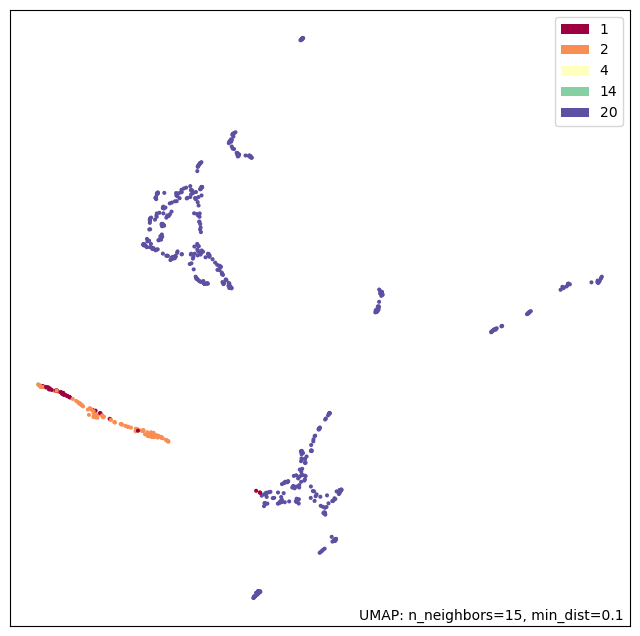

In [51]:
# Umap
gg_data = merged_gg[
    [
    "PC1",
    "PC2"
    ]
].values

mapper_gg = umap.UMAP().fit(gg_data)

# Plot
umap.plot.points(mapper_gg,labels=merged_gg.transformed_aa)


# Bray_Curtis Distance Method
[Back to top](#Quick-Access-to)

#### Calculate Bray-Curtis Distance

In [52]:
# Calculate Distance
bc_freqs = word_vector.Freqs(seq_records.length_list, word_pattern)
bc_dist = word_distance.Distance(counts, 'braycurtis')
bc_dist.pairwise_distance(0, 1)
bc_matrix = distmatrix.create(seq_records.id_list, bc_dist)

bc_matrix.data

array([[0.        , 0.41037037, 0.43678161, ..., 0.48424069, 0.5578635 ,
        0.44970414],
       [0.41037037, 0.        , 0.38484398, ..., 0.45481481, 0.57296467,
        0.44563553],
       [0.43678161, 0.38484398, 0.        , ..., 0.46551724, 0.58928571,
        0.4272997 ],
       ...,
       [0.48424069, 0.45481481, 0.46551724, ..., 0.        , 0.60534125,
        0.46449704],
       [0.5578635 , 0.57296467, 0.58928571, ..., 0.60534125, 0.        ,
        0.54601227],
       [0.44970414, 0.44563553, 0.4272997 , ..., 0.46449704, 0.54601227,
        0.        ]])

#### Transform

In [53]:
# Create dataframe

bc = pd.DataFrame(bc_matrix.data, index=seq_records.id_list, columns=seq_records.id_list)

# Multidimensional Scaling (MDS)
mds = MDS(random_state = 0, dissimilarity="precomputed")
bc_transform = mds.fit_transform(bc)


# Create coordinates
braycurtis = pd.DataFrame(bc_transform, index=seq_records.id_list, columns = ["PC1", "PC2"])

braycurtis

/Users/yufeimeng/opt/anaconda3/lib/python3.9/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


,PC1,PC2
sp|A0AHW2|SYFA_LISW6,-0.071767,0.170970
sp|A0KKP5|SYFA_AERHH,0.142200,0.128614
sp|A0L4K0|SYFA_MAGMM,0.179599,0.286890
sp|A0LFC6|SYFA_SYNFM,0.100078,-0.066754
sp|A0M6W9|SYFA_GRAFK,-0.064083,0.234507
...,...,...
sp|Q9Z7A4|SYW_CHLPN,-0.387419,-0.110169
sp|Q9ZD76|SYW_RICPR,-0.467416,-0.056728
sp|Q9ZDB5|SYFA_RICPR,0.107618,0.398232
sp|Q9ZJX4|SYW_HELPJ,-0.417970,-0.196786


In [54]:
# Add entry column
braycurtis["Entry"] = entry

# Use subset = data[["Entry", "AAs","transformed_aa"]]
subset = data[["Entry", "AAs","transformed_aa"]]
merged_bc = pd.merge(braycurtis, subset)

merged_bc

,PC1,PC2,Entry,AAs,transformed_aa
0,-0.071767,0.170970,A0AHW2,Phenylalanine,20
1,0.142200,0.128614,A0KKP5,Phenylalanine,20
2,0.179599,0.286890,A0L4K0,Phenylalanine,20
3,0.100078,-0.066754,A0LFC6,Phenylalanine,20
4,-0.064083,0.234507,A0M6W9,Phenylalanine,20
...,...,...,...,...,...
736,-0.387419,-0.110169,Q9Z7A4,Tryptophan,2
737,-0.467416,-0.056728,Q9ZD76,Tryptophan,2
738,0.107618,0.398232,Q9ZDB5,Phenylalanine,20
739,-0.417970,-0.196786,Q9ZJX4,Tryptophan,2


#### UMAP

<Axes: >

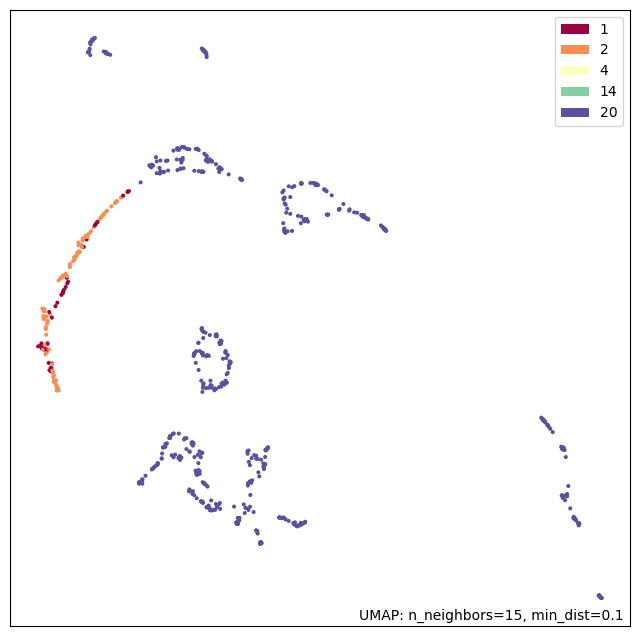

In [55]:
# Umap
bc_data = merged_bc[
    [
    "PC1",
    "PC2"
    ]
].values

mapper_bc = umap.UMAP().fit(bc_data)

# Plot
umap.plot.points(mapper_bc,labels=merged_bc.transformed_aa)


***
# Interactive Euclidean Umap

In [56]:
# Create hover_data 
hover_data = pd.DataFrame({
                           'pc1':merged_euc.PC1,
                           'pc2':merged_euc.PC2,
                           })

hover_data.dtypes

pc1    float64
pc2    float64
dtype: object

In [57]:
p = umap.plot.interactive(mapper_euc, 
                          labels=merged_euc.transformed_aa, 
                          hover_data=hover_data, 
                          point_size=2)
umap.plot.show(p)

TypeError: 'NoneType' object is not iterable